In [1]:
import os
import sys
import yaml
import torch
from gpytorch import kernels, distributions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xarray as xr
import tqdm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.linear_model import LinearRegression

base_dir = os.path.join(os.getcwd(), '..')
sys.path.append(base_dir)

import src.preprocessing as preproc
from src.models import *

def colorbar(mappable):
    last_axes = plt.gca()
    ax = mappable.axes
    fig = ax.figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = fig.colorbar(mappable, cax=cax)
    plt.sca(last_axes)
    return cbar

In [10]:
# Load config file
with open('../config/svgp.yaml', "r") as f:
    cfg = yaml.safe_load(f)
cfg['dataset']['path'] = '../data/aodisaggregation_emmisions_test_6.3_ACCMIP_200806.06_echam.nc'

# Load dataset
data = preproc.make_data(cfg=cfg, include_2d=False)

# Load mass/number concentration dataset
ds_path = '../data/aodisaggregation_emmisions_test_6.3_ACCMIP_200806.06_modes_species.nc'
ds = xr.open_dataset(ds_path)

In [3]:
# Define kernel
time_kernel = kernels.MaternKernel(nu=1.5, ard_num_dims=1, active_dims=[0])
latlon_kernel = kernels.ScaleKernel(kernels.MaternKernel(nu=1.5, ard_num_dims=2, active_dims=[2, 3]))
P_relhum_st_kernel = kernels.ScaleKernel(kernels.RBFKernel(ard_num_dims=3, active_dims=[4, 5, 6]))
kernel = time_kernel * latlon_kernel + P_relhum_st_kernel

# Define aggregation operator
def trpz(grid):
    aggregated_grid = -torch.trapz(y=grid, x=data.h_by_column.unsqueeze(-1), dim=-2)
    return aggregated_grid

# Initialize inducing points regularly across grid
torch.random.manual_seed(cfg['model']['seed'])
lowaltitude_x_std = data.x_std[data.x_std[:, -1] < -0.8]
rdm_idx = torch.randperm(len(lowaltitude_x_std))[:cfg['model']['n_inducing_points']]
inducing_points = lowaltitude_x_std[rdm_idx]

# Initialize model
model = AggregateGammaSVGP(inducing_points=inducing_points,
                           transform=torch.exp,
                           kernel=kernel,
                           aggregate_fn=trpz,
                           fit_intercept=cfg['model']['fit_intercept'])

# Load state dict
state_dict = torch.load('../sandbox/outputs/dev/svgp/state_dict.pt')
model.load_state_dict(state_dict)

<All keys matched successfully>

In [4]:
# Choose a random subset of 1000 points to evaluate model over
torch.random.manual_seed(5)
rdm_idx = torch.randperm(len(data.h_by_column_std))[:1000]

# Initialize empty tensors
prediction_3d_means = torch.zeros_like(data.h_by_column_std[rdm_idx])
prediction_3d_stddevs = torch.zeros_like(data.h_by_column_std[rdm_idx])
h_stddev = data.h_by_column.std()

# Setup index iteration and progress bar
indices = torch.arange(len(data.x_by_column_std[rdm_idx]))
n_samples = len(data.z[rdm_idx])
lbda = cfg['model']['lbda']
batch_size = cfg['evaluation']['batch_size']

with torch.no_grad():
    batch_iter = tqdm.notebook.tqdm(indices.split(batch_size))
    for idx in batch_iter:
        # Predict on standardized 3D covariates
        qf_by_column = model(data.x_by_column_std[idx])

        # Register in grid
        prediction_3d_means[idx] = qf_by_column.mean - lbda * data.h_by_column_std[idx]
        prediction_3d_stddevs[idx] = qf_by_column.stddev

    # Make up for height standardization in integration
    prediction_3d_means.sub_(torch.log(h_stddev))

    # Rescale predictions by τ/∫φdh
    def trpz(grid):
        aggregated_grid = -torch.trapz(y=grid, x=data.h_by_column[rdm_idx].unsqueeze(-1).cpu(), dim=-2)
        return aggregated_grid
    φ = torch.exp(prediction_3d_means + 0.5 * prediction_3d_stddevs.square())
    aggregate_prediction_2d = trpz(φ.unsqueeze(-1)).squeeze()
    correction = torch.log(data.z[rdm_idx]) - torch.log(aggregate_prediction_2d)
    prediction_3d_means.add_(correction.unsqueeze(-1))
    
    # Make distribution
    prediction_3d_dist = torch.distributions.LogNormal(prediction_3d_means, prediction_3d_stddevs)

### Scatter plot prediction vs groundtruth

Text(108.125, 0.5, 'Groundtruth $b_{ext}$')

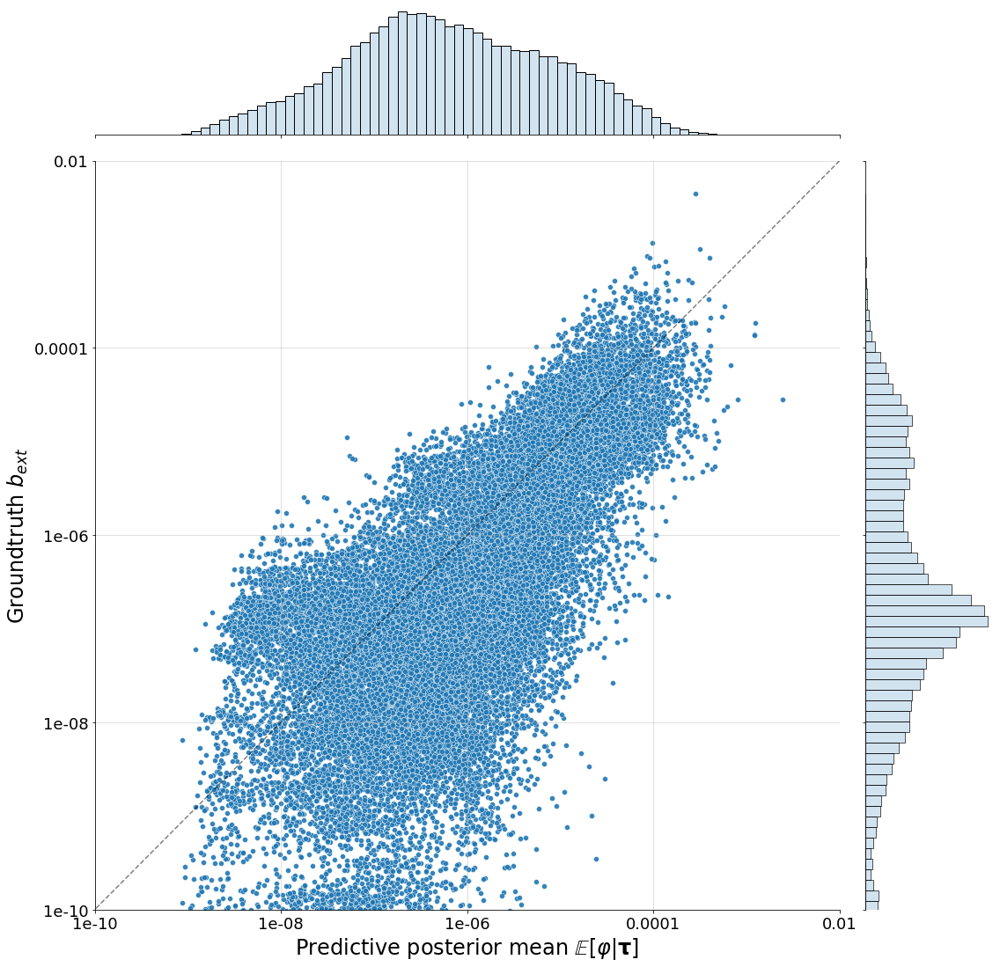

In [5]:
# Flatten tensors
posterior_mean = prediction_3d_dist.mean.flatten()
groundtruth = data.gt_by_column[rdm_idx].flatten()

# Add residual value to ensure groundtruth > 0
groundtruth = groundtruth.clip(min=torch.finfo(torch.float64).eps)

# Take logs
log_posterior_mean = torch.log10(posterior_mean)
log_groundtruth = torch.log10(groundtruth)

# Stack into dataframe
foo = torch.stack([log_posterior_mean, log_groundtruth], dim=-1).numpy()
df = pd.DataFrame(data=foo, columns=['X', 'Y'])

# Make jointplot
g = sns.jointplot(x="X", 
                  y="Y",
                  height=15,
                  data=df,
                  alpha=0.9,
                  marginal_kws=dict(alpha=0.2),
                 )

lims = [
    np.min([g.ax_joint.get_xlim(), g.ax_joint.get_ylim()]),  # min of both axes
    np.max([g.ax_joint.get_xlim(), g.ax_joint.get_ylim()]),  # max of both axes
]
g.ax_joint.plot(lims, lims, 'k--', alpha=0.5)

g.ax_joint.set_xticks([-10, -8, -6, -4, -2])
g.ax_joint.set_xticklabels([1e-10, 1e-8, 1e-6, 1e-4, 1e-2], fontsize=18)
g.ax_joint.set_yticks([-10, -8, -6, -4, -2])
g.ax_joint.set_yticklabels([1e-10, 1e-8, 1e-6, 1e-4, 1e-2], fontsize=18)
g.ax_joint.set_xlim(-10, -2)
g.ax_joint.set_ylim(-10, -2)
g.ax_joint.grid(alpha=0.5)
g.ax_joint.set_xlabel(r'Predictive posterior mean $\mathbb{E}[\varphi|\mathbf{\tau}]$', fontsize=24)
g.ax_joint.set_ylabel(r'Groundtruth $b_{ext}$', fontsize=24)

## Scatter plot prediction vs mass/number concentrations

In [6]:
# Flatten tensors
posterior_mean = prediction_3d_dist.mean.flatten()
groundtruth = data.gt_by_column[rdm_idx].flatten()

# Add residual value to ensure groundtruth > 0
groundtruth = groundtruth.clip(min=torch.finfo(torch.float64).eps)

# Take logs
log_posterior_mean = torch.log10(posterior_mean)
log_groundtruth = torch.log10(groundtruth)

In [8]:
def scatter_plot(key, ylim=None, alpha=0.1, xlim=(1e-9, 1e-3), figsize=(15, 15)):
    # Against CCN
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    
    # Extract datarray corresponding to key
    values = ds[key].values.transpose(0, 2, 3, 1).reshape(-1, 31)[rdm_idx].flatten()
    log_values = np.log10(values + np.finfo(np.float64).eps)
    
    # Create an outlier mask for robust regression
    q05, q95 = np.percentile(values, q=[5, 95])
    mask_outliers = (values > q05) & (values < q95)

    # Fit linear regression to logprediction/loggroundtruth vs log key target
    lm_posterior = LinearRegression()
    lm_posterior.fit(log_posterior_mean[mask_outliers].reshape(-1, 1), 
                     log_values[mask_outliers])
    lm_gt = LinearRegression()
    lm_gt.fit(log_groundtruth[mask_outliers].reshape(-1, 1), 
              log_values[mask_outliers])

    # Get linear model prediction for plot
    t = np.linspace(*xlim).reshape(-1, 1)
    posterior_regression_line = 10**(lm_posterior.predict(np.log10(t)))
    gt_regression_line = 10**(lm_gt.predict(np.log10(t)))

    # Scatter plot
    ax.scatter(groundtruth, values, alpha=alpha, label='Groundtruth', 
               color='none', edgecolor='tomato')
    ax.scatter(posterior_mean, values, alpha=alpha, label='Posterior mean', 
               color='none', edgecolor='cornflowerblue')

    # Plot regression lines
    ax.plot(t, posterior_regression_line, '--', lw=3,
            color='royalblue', label=f'y = {lm_posterior.coef_[0].item()}x + {lm_posterior.intercept_}')
    ax.plot(t, gt_regression_line, '--', lw=3,
            color='firebrick', label=f'y = {lm_gt.coef_[0].item()}x + {lm_gt.intercept_}')

    # Format plot and return
    ax.set_xlabel(r"$b_{ext}$", fontsize=16)
    ax.set_ylabel(key, fontsize=16)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid(alpha=0.5)
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)
    leg = plt.legend(fontsize=12)
    for lh in leg.legendHandles: 
        lh.set_alpha(1)
    return fig, ax

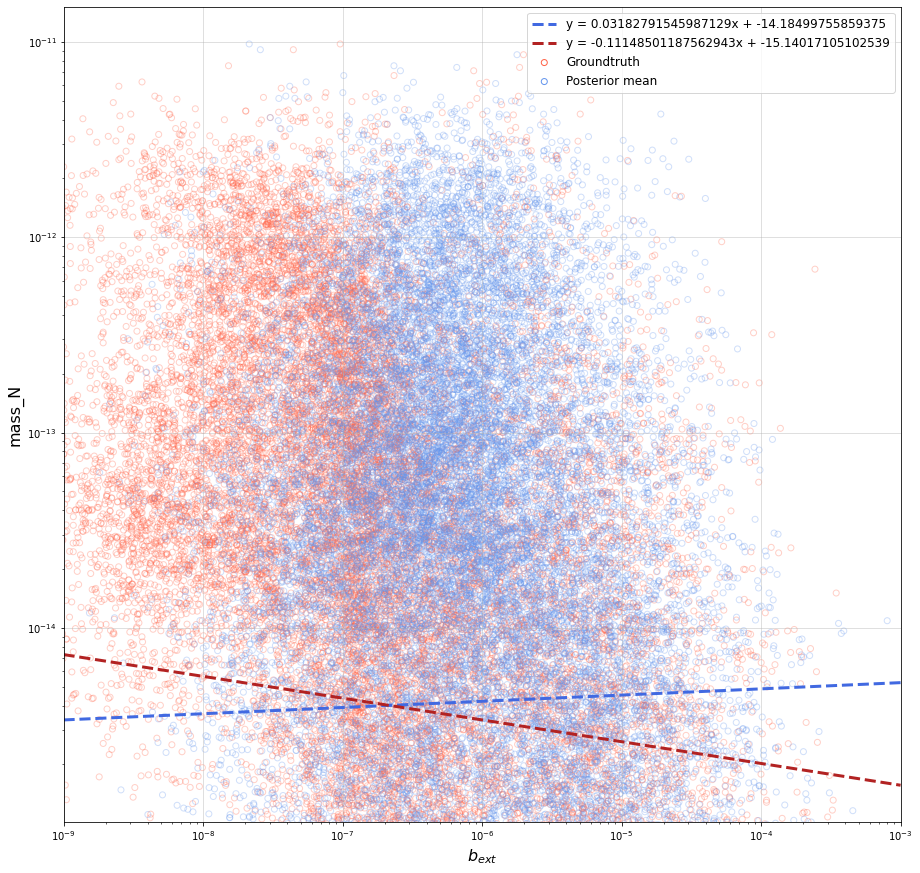

In [11]:
fig, ax = scatter_plot('mass_N', alpha=0.3)

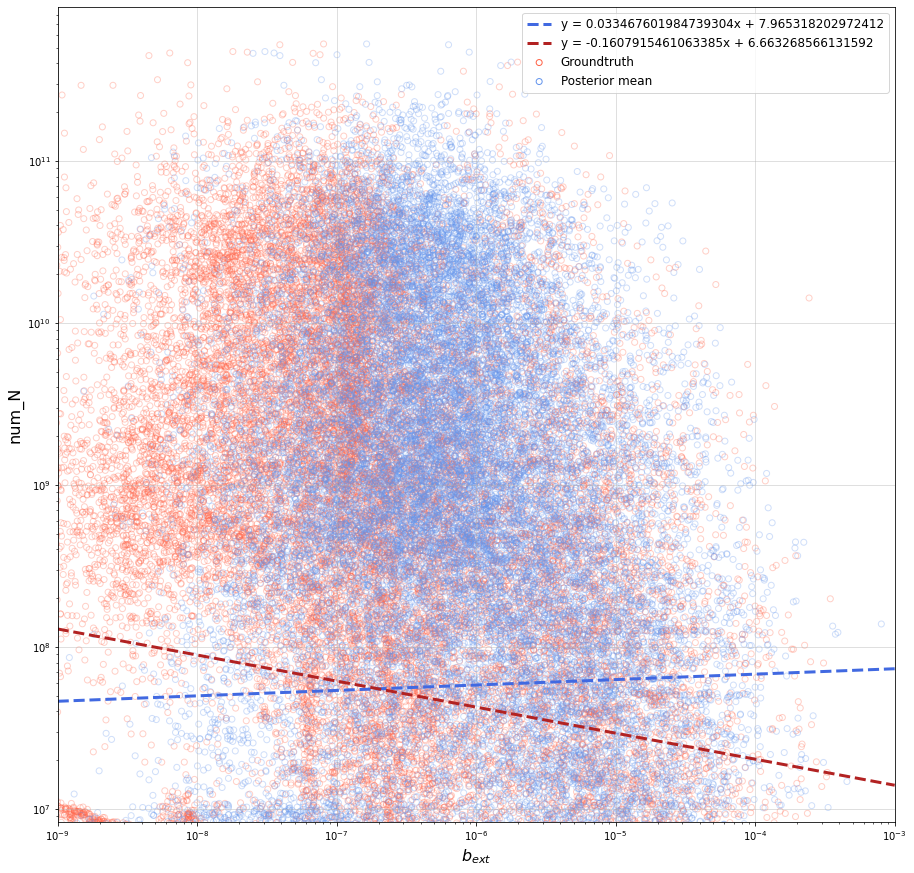

In [12]:
fig, ax = scatter_plot('num_N', alpha=0.3)

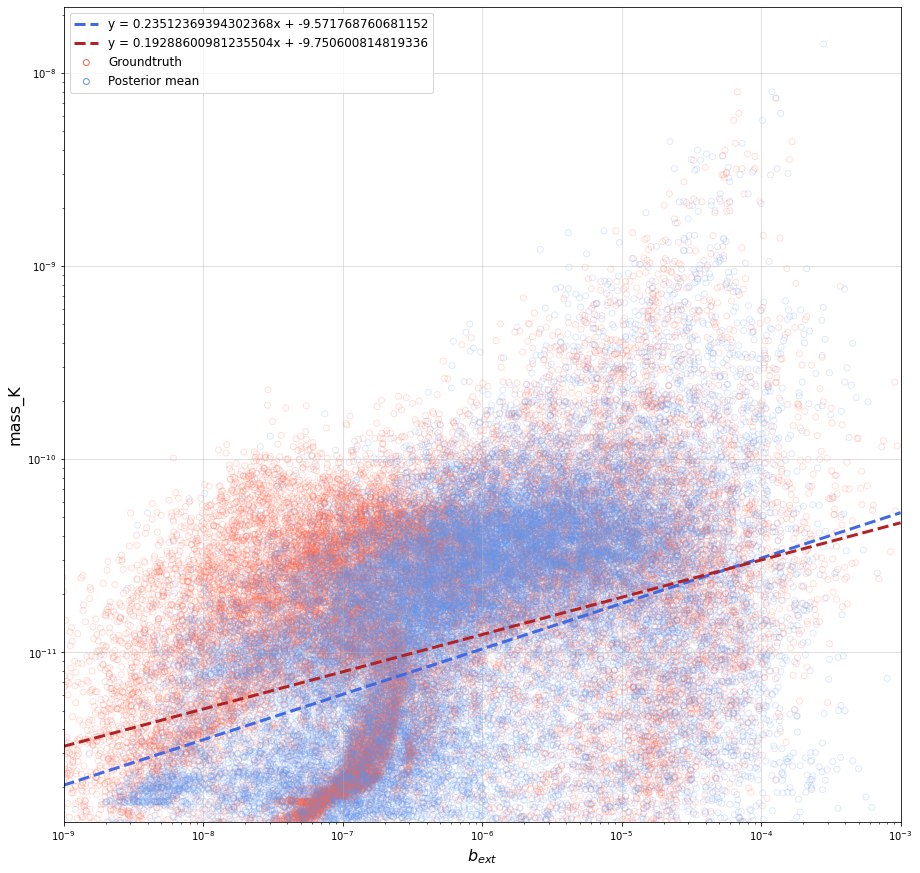

In [13]:
fig, ax = scatter_plot('mass_K', alpha=0.2)

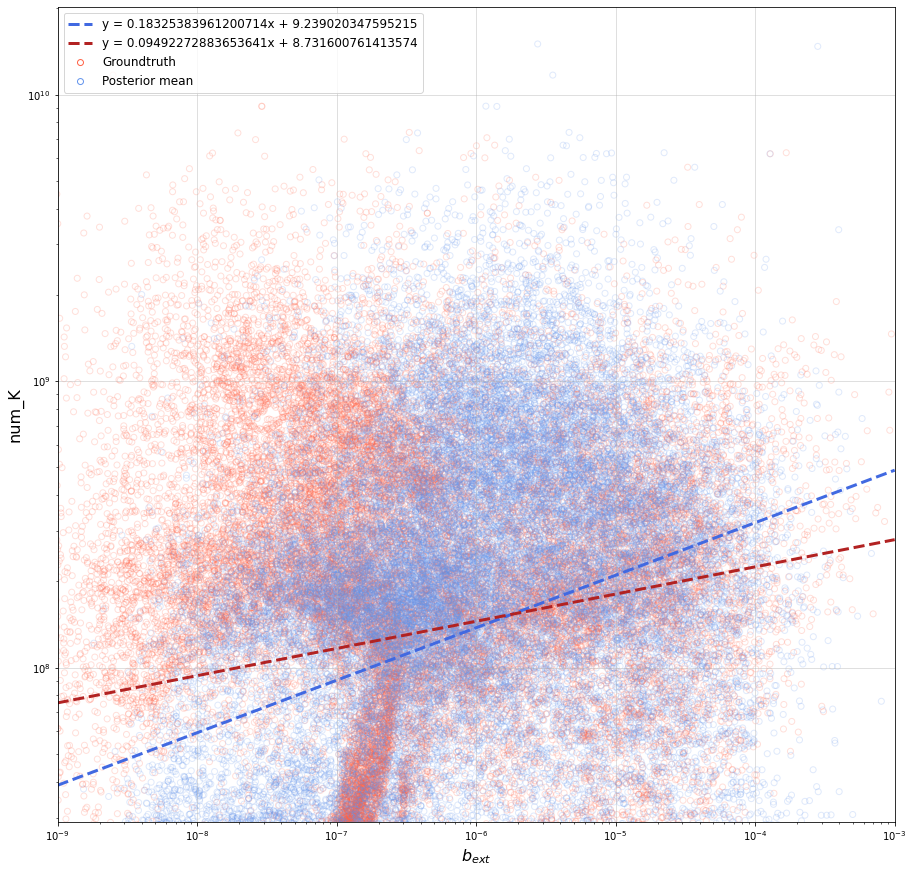

In [14]:
fig, ax = scatter_plot('num_K', alpha=0.2)

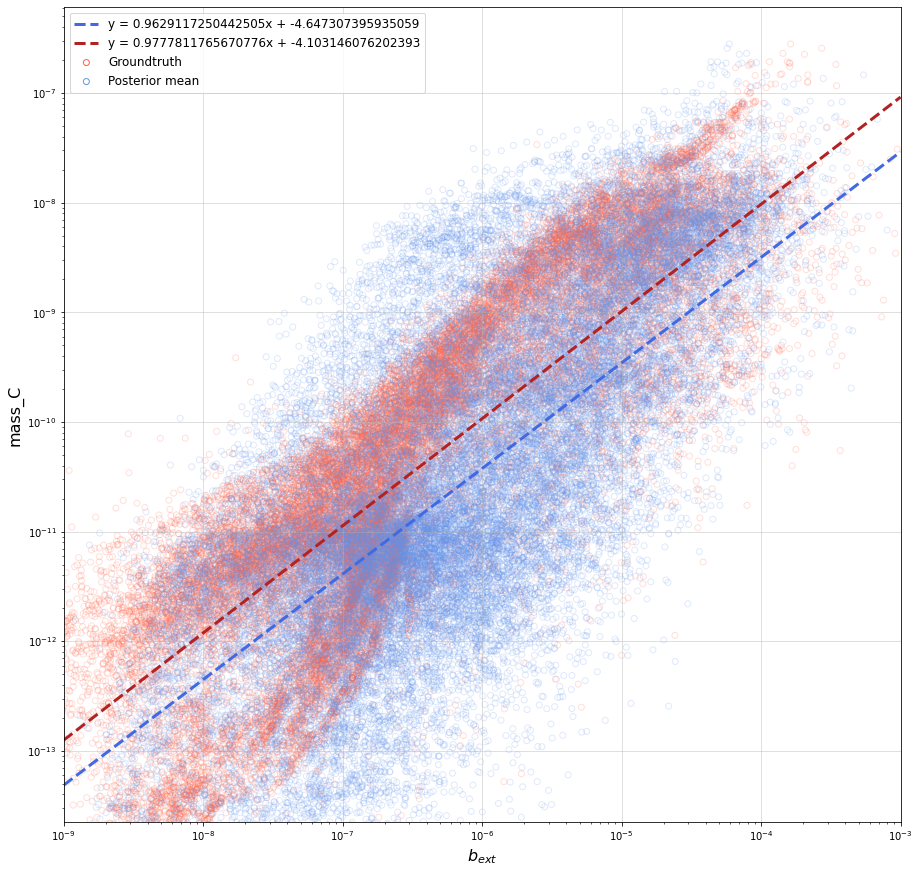

In [15]:
fig, ax = scatter_plot('mass_C', alpha=0.2)

<ipython-input-8-394b02daab29>:7: RuntimeWarning: invalid value encountered in log10
  log_values = np.log10(values + np.finfo(np.float64).eps)


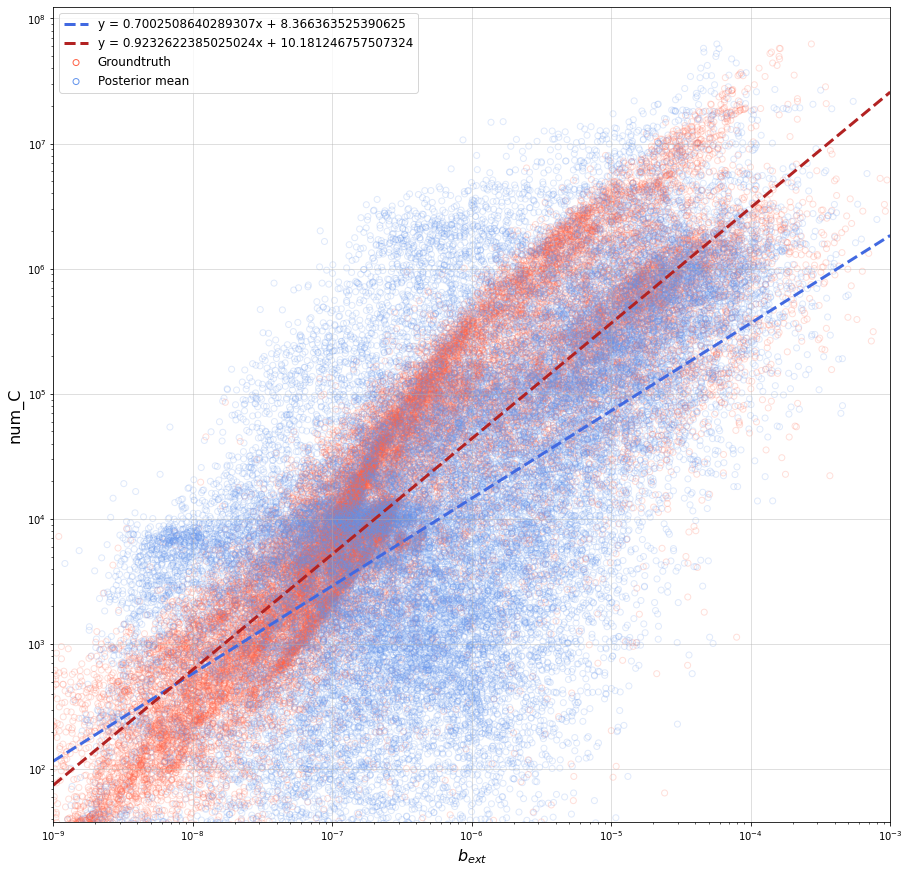

In [16]:
fig, ax = scatter_plot('num_C', alpha=0.2)

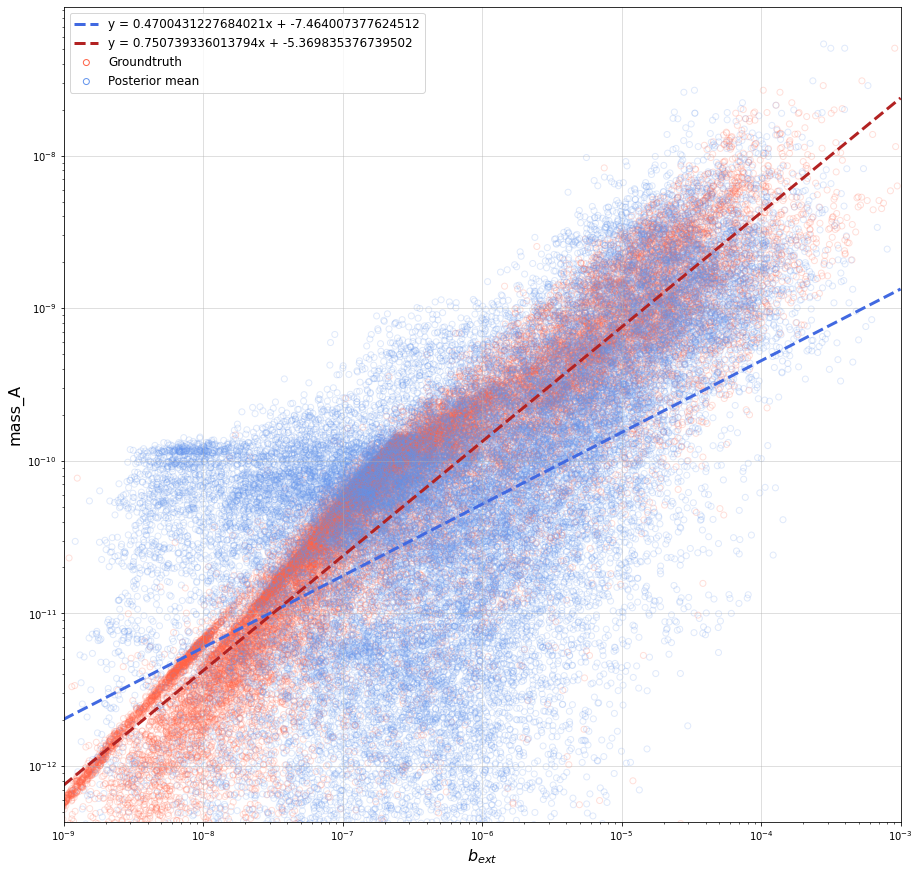

In [17]:
fig, ax = scatter_plot('mass_A', alpha=0.2)

<ipython-input-8-394b02daab29>:7: RuntimeWarning: invalid value encountered in log10
  log_values = np.log10(values + np.finfo(np.float64).eps)


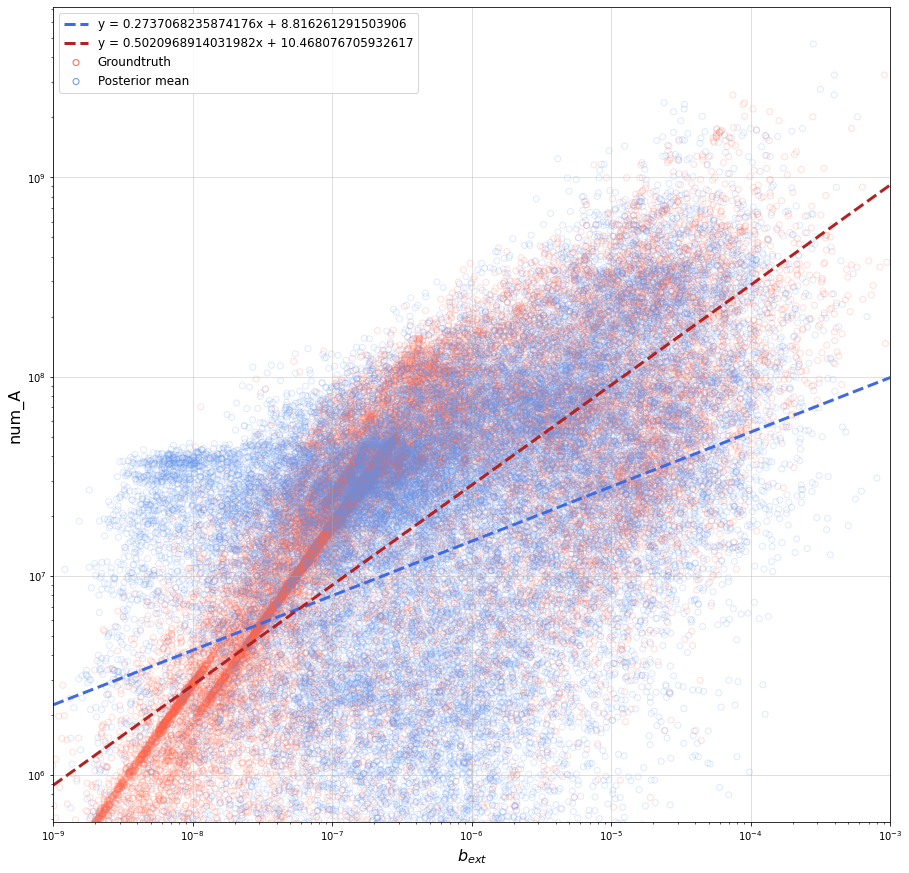

In [18]:
fig, ax = scatter_plot('num_A', alpha=0.2)

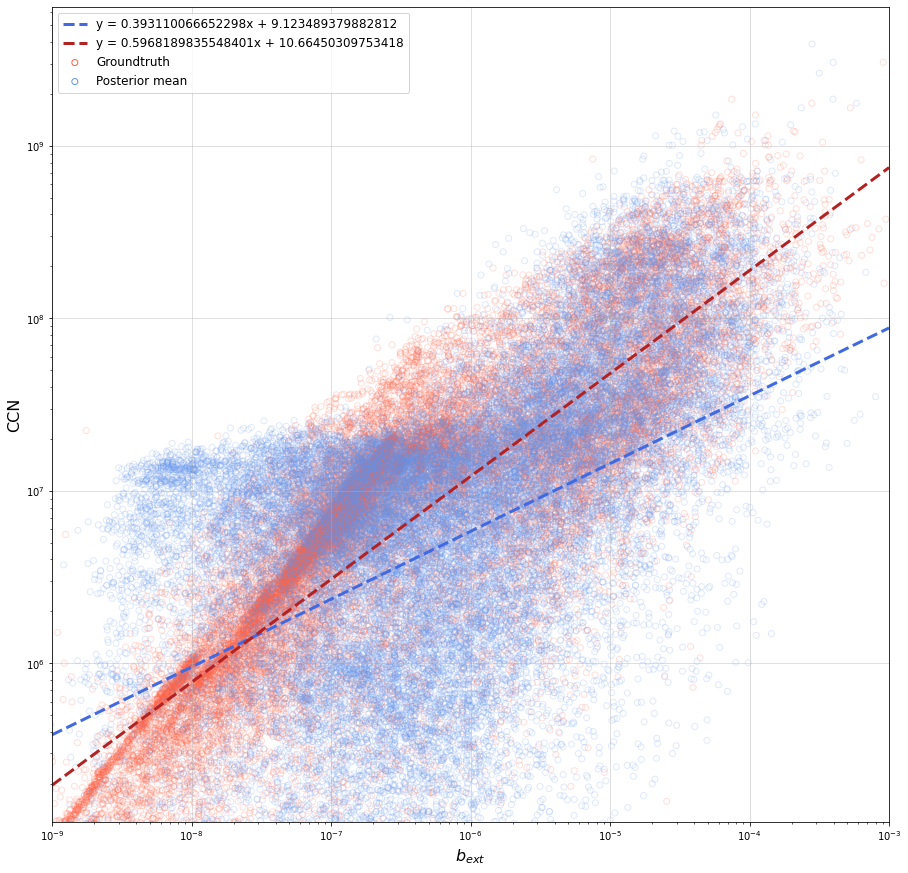

In [19]:
fig, ax = scatter_plot('CCN', alpha=0.2)

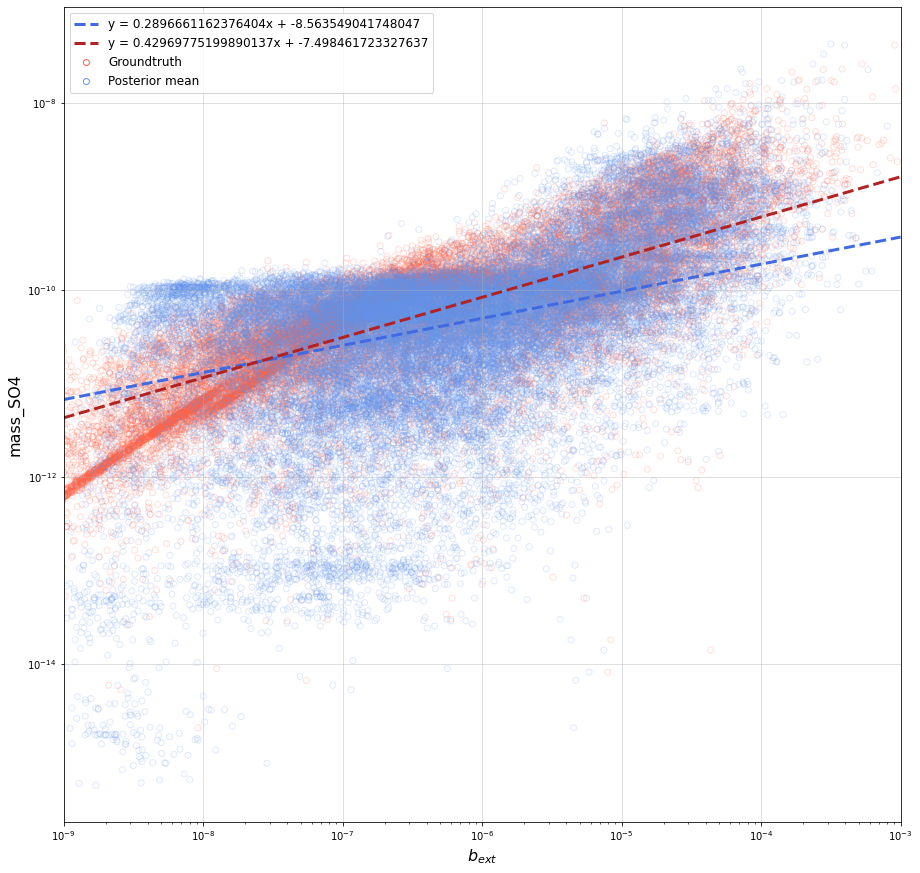

In [20]:
fig, ax = scatter_plot('mass_SO4', alpha=0.2)

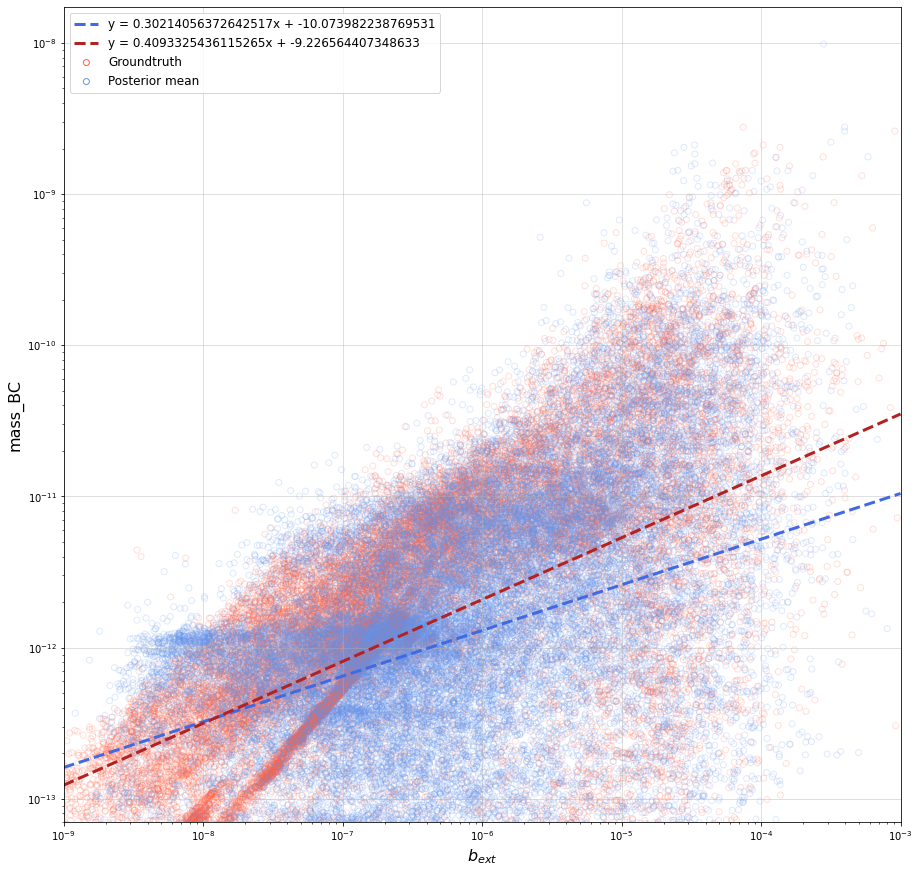

In [21]:
fig, ax = scatter_plot('mass_BC', alpha=0.2)

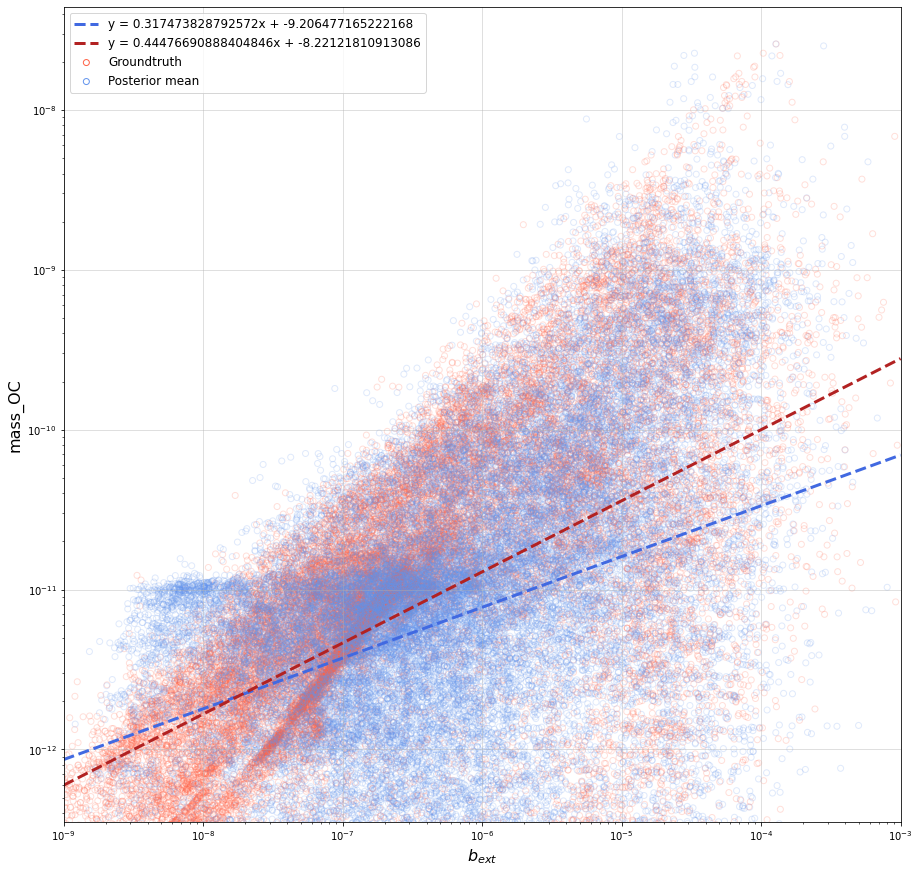

In [22]:
fig, ax = scatter_plot('mass_OC', alpha=0.2)

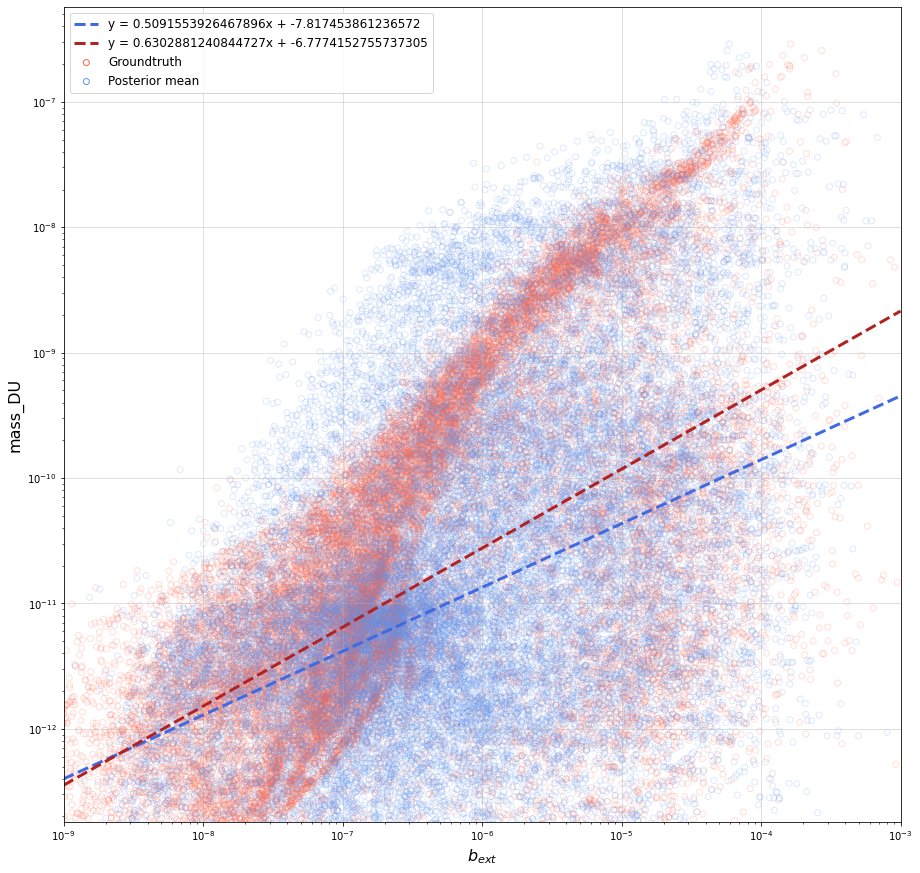

In [23]:
fig, ax = scatter_plot('mass_DU', alpha=0.2)

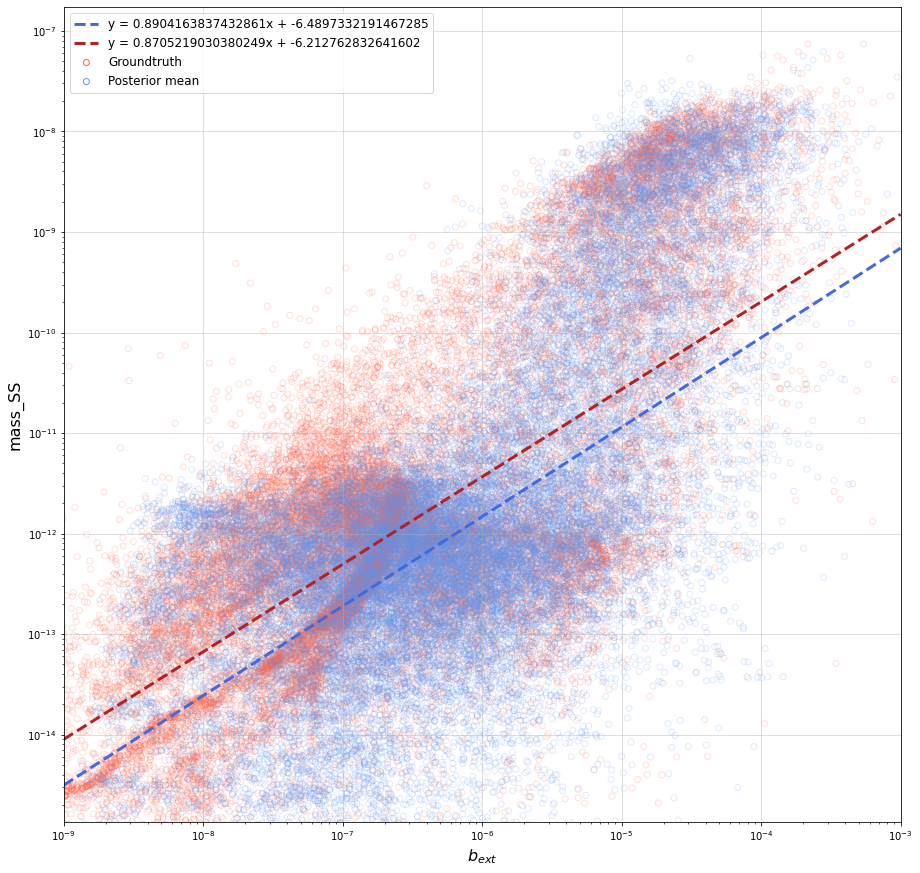

In [24]:
fig, ax = scatter_plot('mass_SS', alpha=0.2)